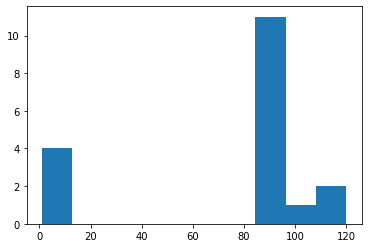

In [ ]:
import matplotlib.pyplot as plt

image = [87,90,1,1,89,89,87,120,120,88,100,90,2,88,88,2,90,90]
plt.hist(image, bins=10)
plt.show()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


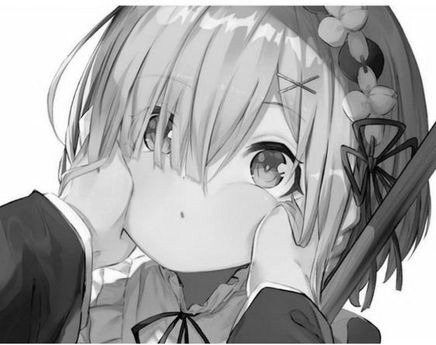

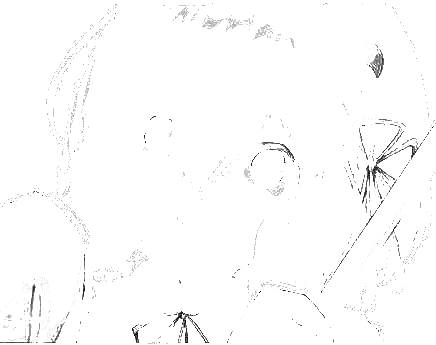

In [ ]:
import numpy as np
from PIL import Image
import PIL
from google.colab import drive

drive.mount('/content/drive')
image = Image.open("/content/sample.jpg")
res= PIL.Image.new(image.mode, image.size)
lmax = 0
mmin = image.getpixel((0,0))[0]
for y in range(image.width):
  for x in range(image.height):
    if image.getpixel((y,x))[0]>lmax:
      lmax = image.getpixel((y,x))[0]
    if image.getpixel((y,x))[0]<mmin:
      mmin = image.getpixel((y,x))[0]

frequency = np.zeros(lmax+1)

for y in range(image.width):
  for x in range(image.height):
    frequency[image.getpixel((y,x))[0]] = frequency[image.getpixel((y,x))[0]] + 1

lmin = 0
mmax = lmax
ldiff = lmax - lmin
mdiff = mmax - mmin
lval = np.zeros(lmax+1)
for i in range(lmax+1):
  lval[i] = round(((ldiff*(i-mmin))/mdiff) + lmin)
 
new_freq = np.zeros(lmax+1)
m_map = np.zeros(lmax+1)

for i in range(lmax+1):
  m_map[int(lval[i])] = m_map[int(lval[i])] + frequency[i] 

for i in range(lmax+1):
  new_freq[i] = new_freq[i] + m_map[i]

for y in range(image.width):
  for x in range(image.height):
    value = int(round(new_freq[image.getpixel((y,x))[0]]))
    res.putpixel((y,x),(value,value,value))
display(image)
display(res)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


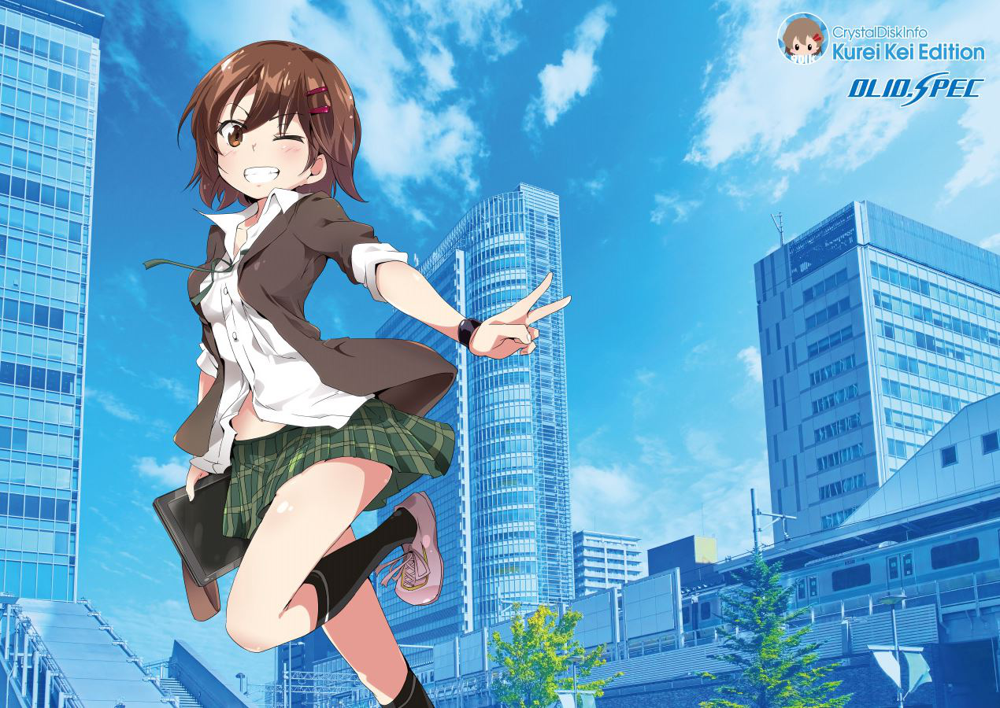

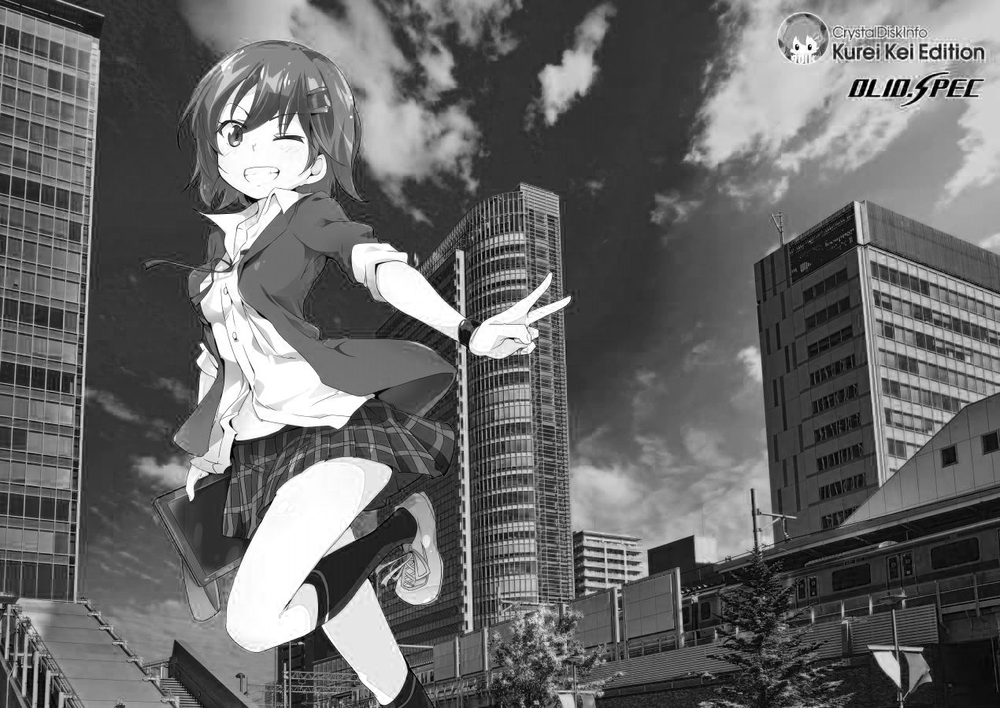

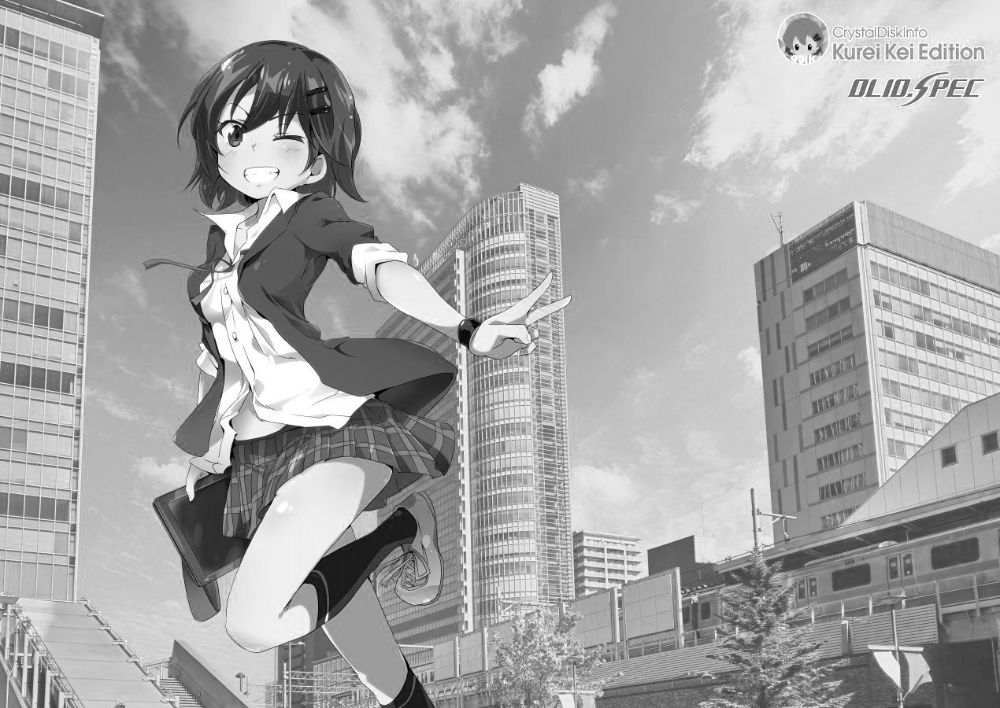

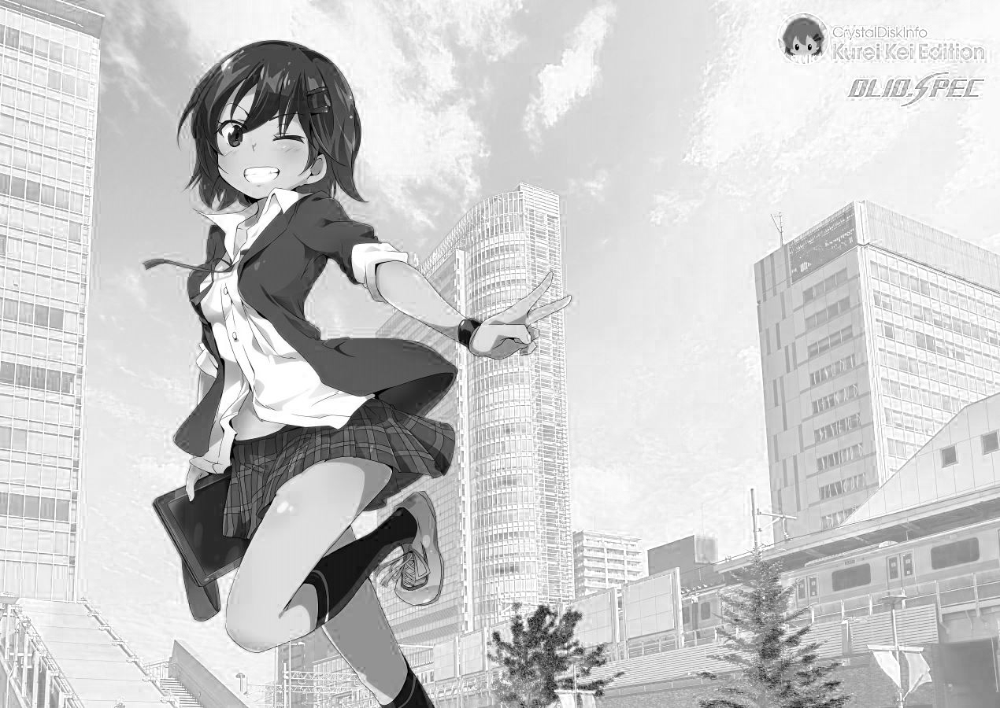

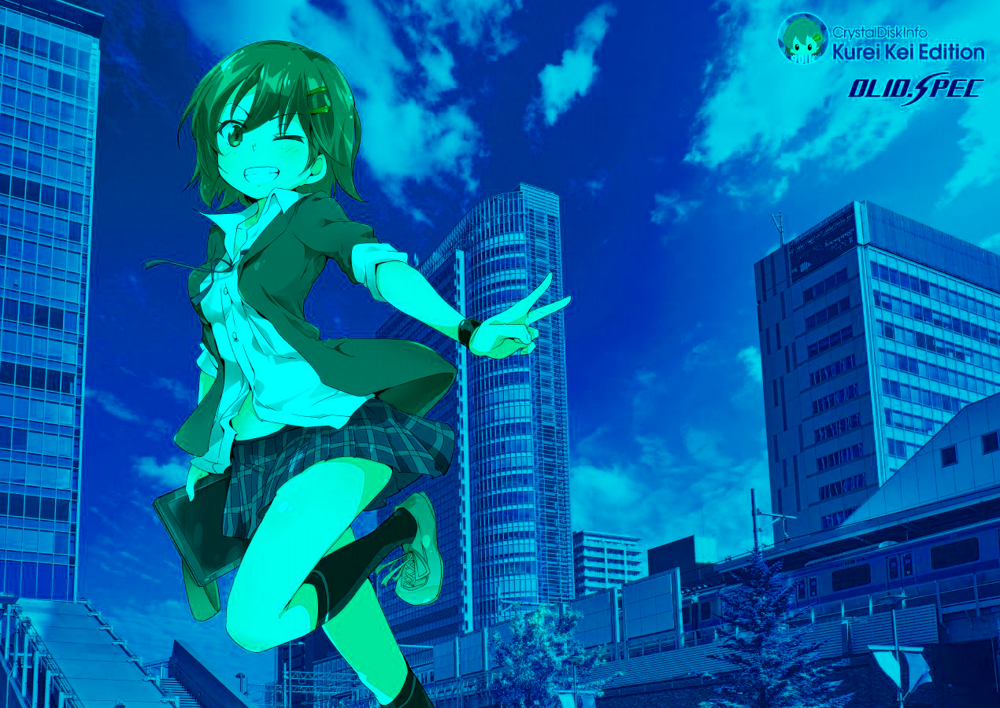

In [ ]:
import numpy as np
from PIL import Image
import PIL
from google.colab import drive
import scipy.ndimage

drive.mount('/content/drive')
image = Image.open("/content/B2.jpg")
display(image)
res0= PIL.Image.new(image.mode, image.size)
res1= PIL.Image.new(image.mode, image.size)
res2= PIL.Image.new(image.mode, image.size)

for y in range(image.width):
  for x in range(image.height):
    value0 = image.getpixel((y,x))[0]
    value1 = image.getpixel((y,x))[1]
    value2 = image.getpixel((y,x))[2]
    res0.putpixel((y,x),(value0,value0,value0))
    res1.putpixel((y,x),(value1,value1,value1))
    res2.putpixel((y,x),(value2,value2,value2))
display(res0)
display(res1)
display(res2)
shifted = scipy.ndimage.shift(image, np.array([0, 0, 1]))
shifted = Image.fromarray(shifted, 'RGB')
display(shifted)

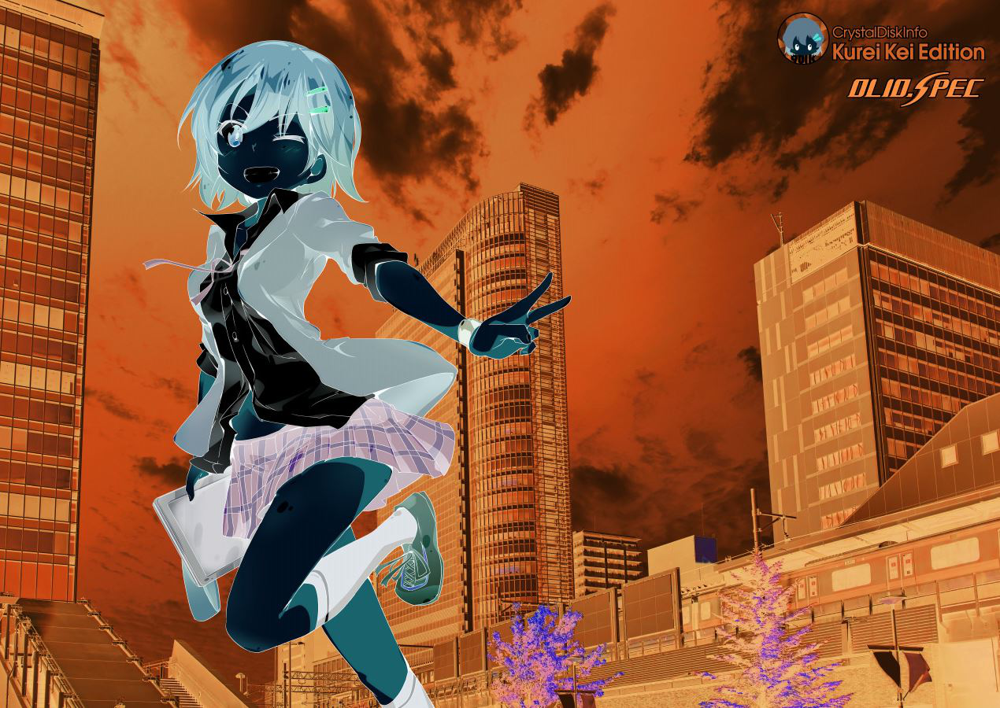

In [ ]:
neg = PIL.Image.new(image.mode, image.size)
for y in range(image.width):
  for x in range(image.height):
    value0 = image.getpixel((y,x))[0]
    value1 = image.getpixel((y,x))[1]
    value2 = image.getpixel((y,x))[2]
    neg.putpixel((y,x),(255 - value0,255 - value1,255 - value2))
display(neg)


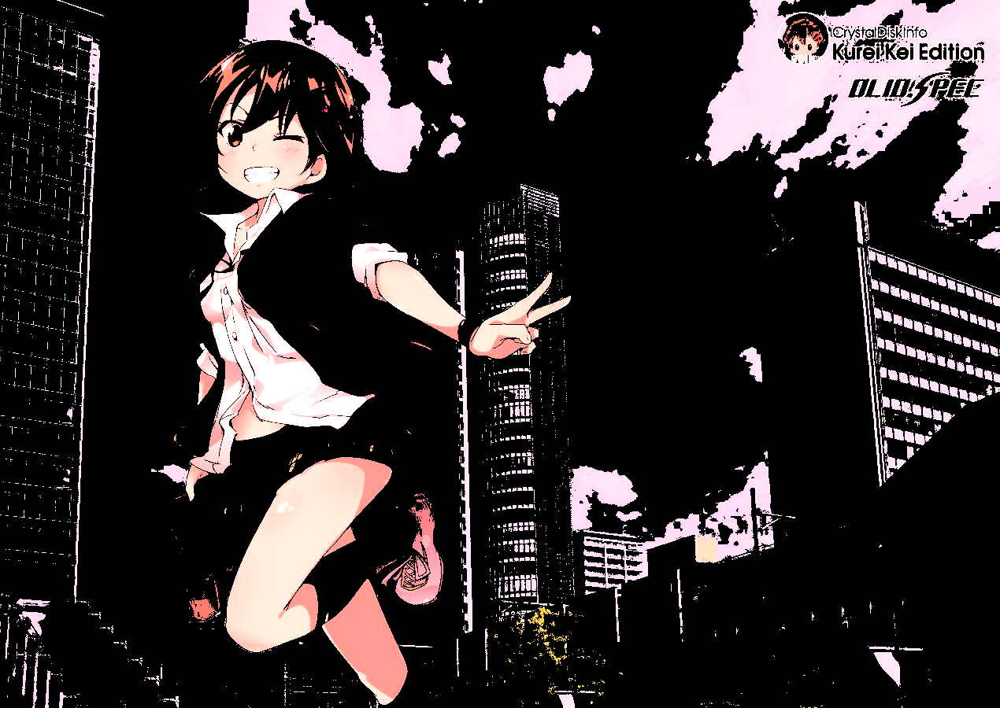

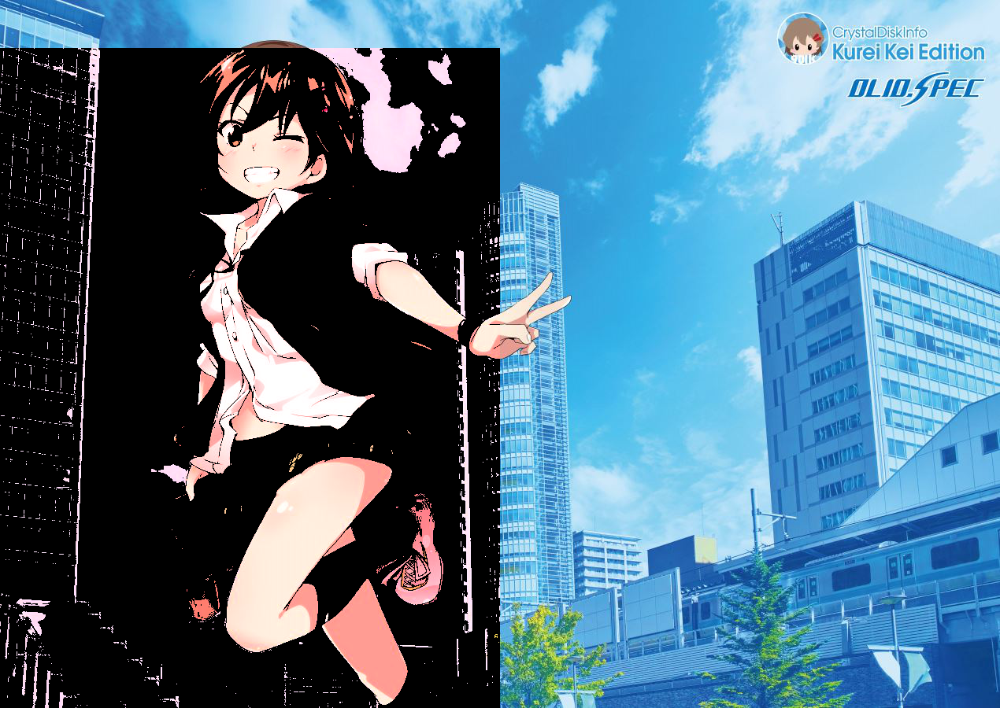

In [ ]:
image = Image.open("/content/B2.jpg")
globthres = PIL.Image.new(image.mode, image.size)
locthres = PIL.Image.new(image.mode, image.size)
for y in range(image.width):
  for x in range(image.height):
    value0 = image.getpixel((y,x))[0]
    value1 = image.getpixel((y,x))[1]
    value2 = image.getpixel((y,x))[2]
    if(value0>=165):
      globthres.putpixel((y,x),(255,value1,value2))
    else:
      globthres.putpixel((y,x),(0,0,0))
for y in range(image.width):
  for x in range(image.height):
    value0 = image.getpixel((y,x))[0]
    value1 = image.getpixel((y,x))[1]
    value2 = image.getpixel((y,x))[2]
    if(y<image.width/2 and x>image.height/15):
      if(value0>=165):
        locthres.putpixel((y,x),(255,value1,value2))
      else:
        locthres.putpixel((y,x),(0,0,0))
    else:
      locthres.putpixel((y,x),(value0,value1,value2))
display(globthres)
display(locthres)

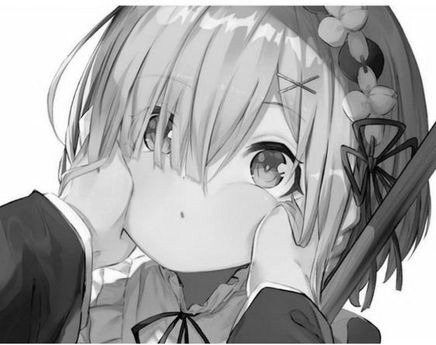

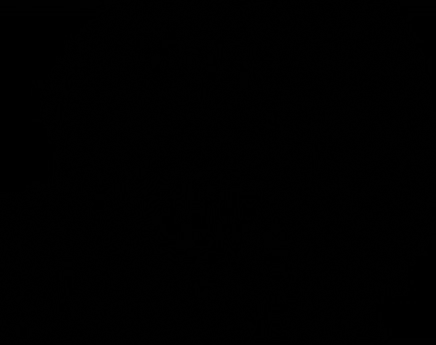

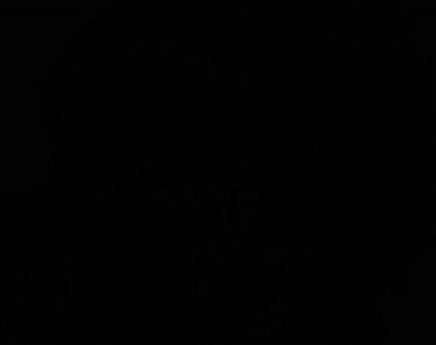

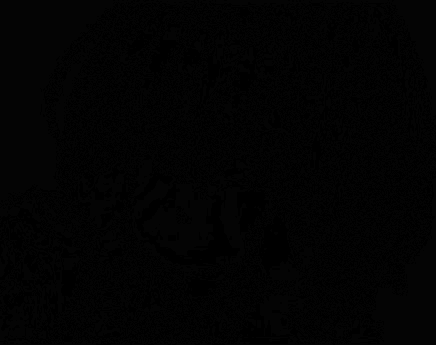

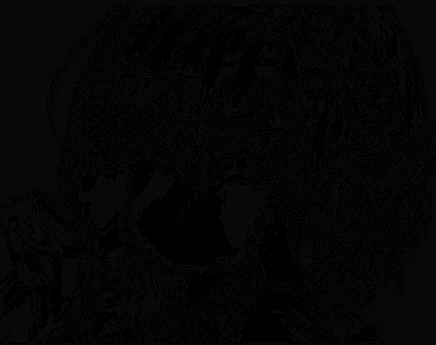

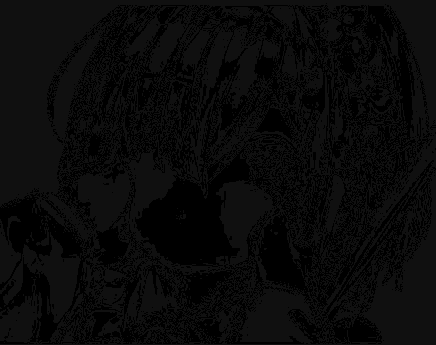

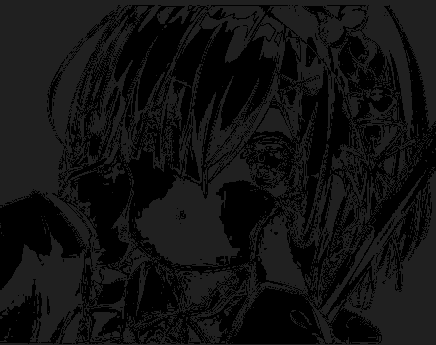

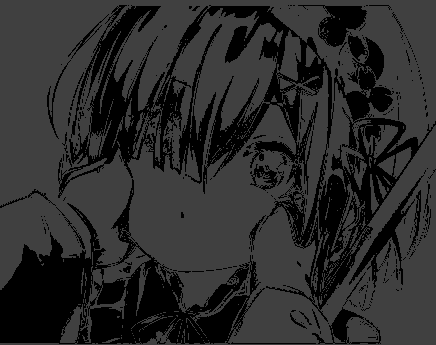

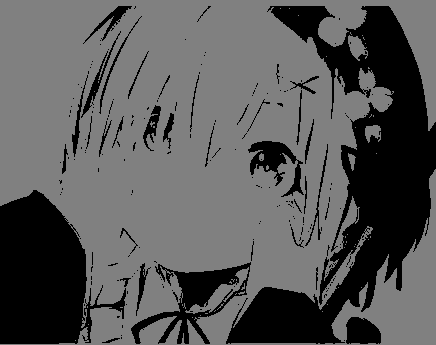

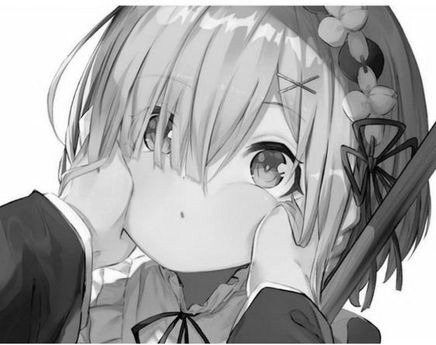

In [ ]:
image = Image.open("/content/sample.jpg")
bit0 = PIL.Image.new(image.mode, image.size)
bit1 = PIL.Image.new(image.mode, image.size)
bit2 = PIL.Image.new(image.mode, image.size)
bit3 = PIL.Image.new(image.mode, image.size)
bit4 = PIL.Image.new(image.mode, image.size)
bit5 = PIL.Image.new(image.mode, image.size)
bit6 = PIL.Image.new(image.mode, image.size)
bit7 = PIL.Image.new(image.mode, image.size)
resampled_image = PIL.Image.new(image.mode, image.size)
for y in range(image.width):
  for x in range(image.height):
    value = image.getpixel((y,x))[0]
    bit0.putpixel((y,x),(value&1,value&1,value&1))
    bit1.putpixel((y,x),(value&2,value&2,value&2))
    bit2.putpixel((y,x),(value&4,value&4,value&4))
    bit3.putpixel((y,x),(value&8,value&8,value&8))
    bit4.putpixel((y,x),(value&16,value&16,value&16))
    bit5.putpixel((y,x),(value&32,value&32,value&32))
    bit6.putpixel((y,x),(value&64,value&64,value&64))
    bit7.putpixel((y,x),(value&128,value&128,value&128))
    r_val = bit0.getpixel((y,x))[0]+bit1.getpixel((y,x))[0]+bit2.getpixel((y,x))[0]+bit3.getpixel((y,x))[0]+bit4.getpixel((y,x))[0]+bit5.getpixel((y,x))[0]+bit6.getpixel((y,x))[0]+bit7.getpixel((y,x))[0]
    g_val = bit0.getpixel((y,x))[1]+bit1.getpixel((y,x))[1]+bit2.getpixel((y,x))[1]+bit3.getpixel((y,x))[1]+bit4.getpixel((y,x))[1]+bit5.getpixel((y,x))[1]+bit6.getpixel((y,x))[1]+bit7.getpixel((y,x))[1]
    b_val = bit0.getpixel((y,x))[2]+bit1.getpixel((y,x))[2]+bit2.getpixel((y,x))[2]+bit3.getpixel((y,x))[2]+bit4.getpixel((y,x))[2]+bit5.getpixel((y,x))[2]+bit6.getpixel((y,x))[2]+bit7.getpixel((y,x))[2]
    resampled_image.putpixel((y,x),(r_val,g_val,b_val))
display(image)
display(bit0)
display(bit1)
display(bit2)
display(bit3)
display(bit4)
display(bit5)
display(bit6)
display(bit7)
display(resampled_image)

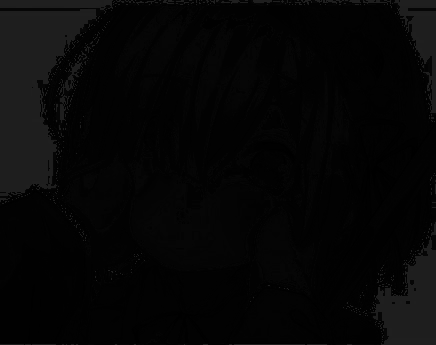

In [ ]:
image = Image.open("/content/sample.jpg")
max = 0
total = 0
hiseq = PIL.Image.new(image.mode, image.size)

for y in range(image.width):
  for x in range(image.height):
    if image.getpixel((y,x))[0]>max:
      max = image.getpixel((y,x))[0]

newfrequency = np.zeros(max+1)

for y in range(image.width):
  for x in range(image.height):
    newfrequency[image.getpixel((y,x))[0]] = newfrequency[image.getpixel((y,x))[0]] + 1
    total = total+1

probability = np.zeros(max+1)

for i in range(max+1):
  probability[i] = newfrequency[i]/total


cumprob = np.zeros(max+1)
roundoff = np.zeros(max+1)
for i in range(max+1):
  if(i == 0):
    cumprob[i] = probability[i]
    continue
  cumprob[i] = probability[i-1] + probability[i]
  temp1 = cumprob[i] * max
  temp1 = round(temp1)
  roundoff[i] = temp1

for y in range(image.width):
  for x in range(image.height):
    value = int(roundoff[image.getpixel((y,x))[0]])
    hiseq.putpixel((y,x),(value,value,value))

display(hiseq)




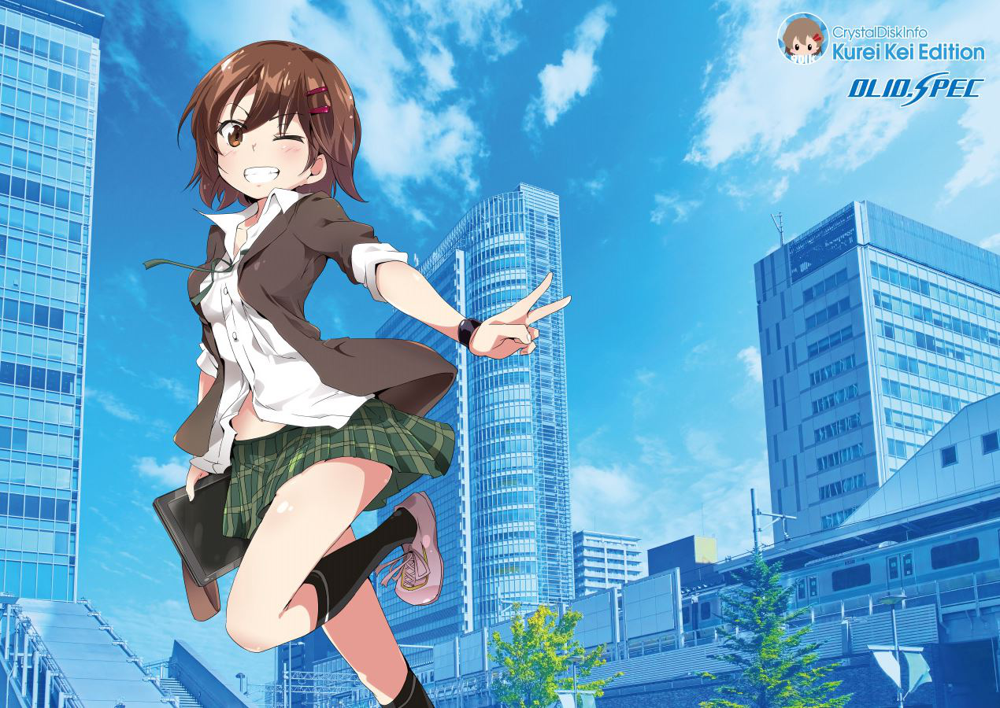

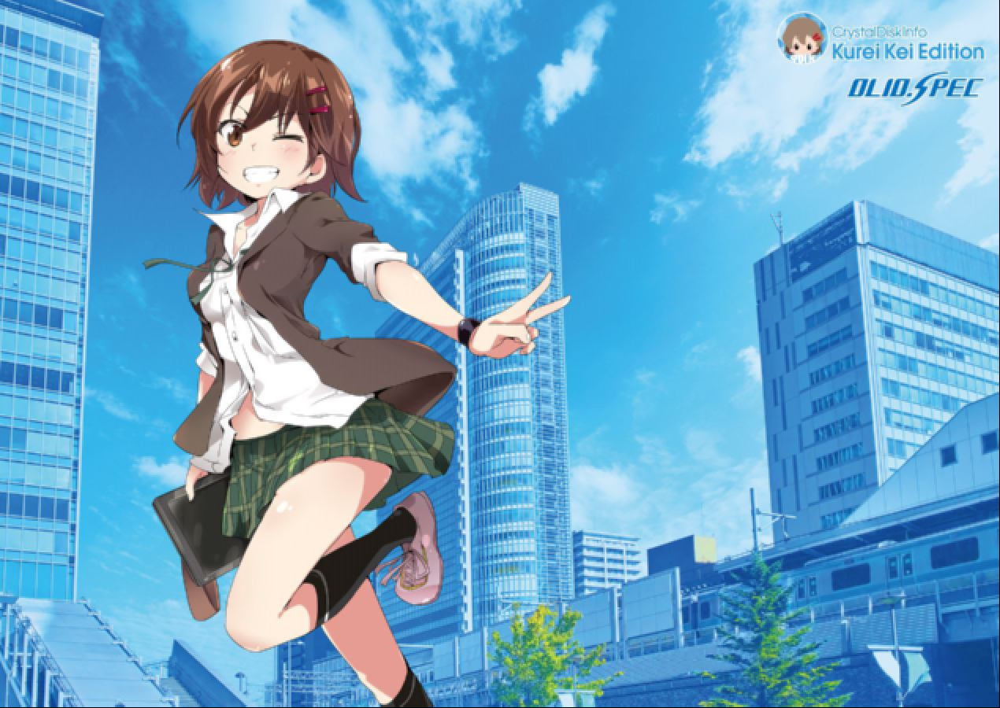

In [ ]:
image = Image.open("/content/B2.jpg")
lowpass = PIL.Image.new(image.mode, image.size)
y = 1

while(y<image.width-1):
  x = 1
  while(x<image.height-1):
    ravg = image.getpixel((y-1,x-1))[0] + image.getpixel((y - 1,x))[0] + image.getpixel((y-1,x+1))[0] + image.getpixel((y,x-1))[0] + image.getpixel((y,x))[0] + image.getpixel((y,x+1))[0] + image.getpixel((y+1,x-1))[0] + image.getpixel((y+1,x))[0] + image.getpixel((y+1,x+1))[0]
    gavg = image.getpixel((y-1,x-1))[1] + image.getpixel((y - 1,x))[1] + image.getpixel((y-1,x+1))[1] + image.getpixel((y,x-1))[1] + image.getpixel((y,x))[1] + image.getpixel((y,x+1))[1] + image.getpixel((y+1,x-1))[1] + image.getpixel((y+1,x))[1] + image.getpixel((y+1,x+1))[1]
    bavg = image.getpixel((y-1,x-1))[2] + image.getpixel((y - 1,x))[2] + image.getpixel((y-1,x+1))[2] + image.getpixel((y,x-1))[2] + image.getpixel((y,x))[2] + image.getpixel((y,x+1))[2] + image.getpixel((y+1,x-1))[2] + image.getpixel((y+1,x))[2] + image.getpixel((y+1,x+1))[2]
    ravg = ravg/9
    gavg = gavg/9
    bavg = bavg/9
    ravg = int(round(ravg))
    gavg = int(round(gavg))
    bavg = int(round(bavg))
    lowpass.putpixel((y-1,x-1),(ravg,gavg,bavg))
    lowpass.putpixel((y-1,x),(ravg,gavg,bavg))
    lowpass.putpixel((y-1,x+1),(ravg,gavg,bavg))
    lowpass.putpixel((y,x-1),(ravg,gavg,bavg))
    lowpass.putpixel((y,x),(ravg,gavg,bavg))
    lowpass.putpixel((y,x+1),(ravg,gavg,bavg))
    lowpass.putpixel((y+1,x-1),(ravg,gavg,bavg))
    lowpass.putpixel((y+1,x),(ravg,gavg,bavg))
    lowpass.putpixel((y+1,x+1),(ravg,gavg,bavg))
    x = x+2
  y = y+2
display(image)
display(lowpass)

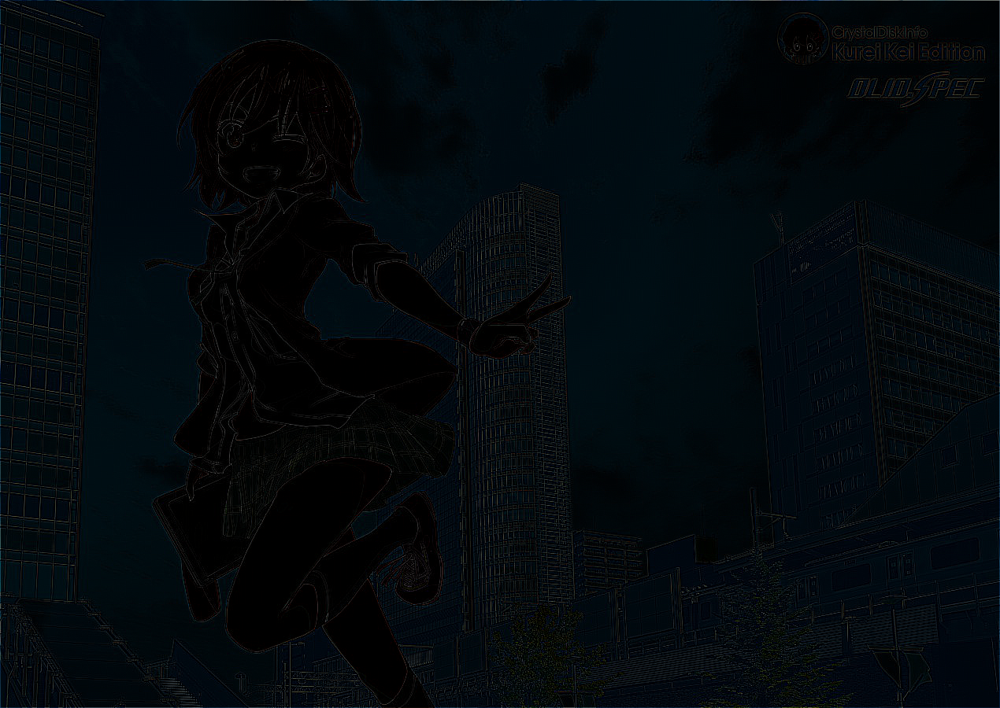

In [ ]:
kernel = [[-1/9,-1/9,-1/9],[-1/9,8/9,-1/9],[-1/9,-1/9,-1/9]]
image = Image.open("/content/B2.jpg")
highpass = PIL.Image.new(image.mode, image.size)
for y in range(image.width):
  for x in range(image.height):
    if(x == 0 and y == 0):
      resr = image.getpixel((y,x))[0] * kernel[1][1] + image.getpixel((y,x+1))[0] * kernel[1][2] + image.getpixel((y+1,x))[0] * kernel[2][1] + image.getpixel((y+1,x+1))[0] * kernel[2][2]
      resg = image.getpixel((y,x))[1] * kernel[1][1] + image.getpixel((y,x+1))[1] * kernel[1][2] + image.getpixel((y+1,x))[1] * kernel[2][1] + image.getpixel((y+1,x+1))[1] * kernel[2][2]
      resb = image.getpixel((y,x))[2] * kernel[1][1] + image.getpixel((y,x+1))[2] * kernel[1][2] + image.getpixel((y+1,x))[2] * kernel[2][1] + image.getpixel((y+1,x+1))[2] * kernel[2][2]
    elif(x == 0 and y == image.width - 1):
      resr = image.getpixel((y-1,x))[0] * kernel[1][0] + image.getpixel((y,x))[0] * kernel[1][1] + image.getpixel((y-1,x+1))[0] * kernel[2][0] + image.getpixel((y,x+1))[0] * kernel[2][1]
      resg = image.getpixel((y-1,x))[1] * kernel[1][0] + image.getpixel((y,x))[1] * kernel[1][1] + image.getpixel((y-1,x+1))[1] * kernel[2][0] + image.getpixel((y,x+1))[1] * kernel[2][1]
      resb = image.getpixel((y-1,x))[2] * kernel[1][0] + image.getpixel((y,x))[2] * kernel[1][1] + image.getpixel((y-1,x+1))[2] * kernel[2][0] + image.getpixel((y,x+1))[2] * kernel[2][1]
    elif(x == image.height-1 and y == 0):
      resr = image.getpixel((y,x-1))[0] * kernel[0][1] + image.getpixel((y+1,x-1))[0] * kernel[0][2] + image.getpixel((y,x))[0] * kernel[1][1] + image.getpixel((y+1,x))[0] * kernel[1][2]
      resg = image.getpixel((y,x-1))[1] * kernel[0][1] + image.getpixel((y+1,x-1))[1] * kernel[0][2] + image.getpixel((y,x))[1] * kernel[1][1] + image.getpixel((y+1,x))[1] * kernel[1][2]
      resb = image.getpixel((y,x-1))[2] * kernel[0][1] + image.getpixel((y+1,x-1))[2] * kernel[0][2] + image.getpixel((y,x))[2] * kernel[1][1] + image.getpixel((y+1,x))[2] * kernel[1][2]
    elif(x == image.height-1 and y == image.width - 1):
      resr = image.getpixel((y-1,x-1))[0] * kernel[0][0] + image.getpixel((y-1,x))[0] * kernel[0][1] + image.getpixel((y,x-1))[0] * kernel[1][0] + image.getpixel((y,x))[0] * kernel[1][1]
      resg = image.getpixel((y-1,x-1))[1] * kernel[0][0] + image.getpixel((y-1,x))[1] * kernel[0][1] + image.getpixel((y,x-1))[1] * kernel[1][0] + image.getpixel((y,x))[1] * kernel[1][1]
      resb = image.getpixel((y-1,x-1))[2] * kernel[0][0] + image.getpixel((y-1,x))[2] * kernel[0][1] + image.getpixel((y,x-1))[2] * kernel[1][0] + image.getpixel((y,x))[2] * kernel[1][1]
    elif(y == 0):
      resr = image.getpixel((y-1,x))[0] * kernel[0][1] + image.getpixel((y-1,x+1))[0] * kernel[0][2] + image.getpixel((y,x))[0] * kernel[1][1] + image.getpixel((y,x+1))[0] * kernel[1][2] + image.getpixel((y+1,x))[0] * kernel[2][1] + image.getpixel((y+1,x+1))[0] * kernel[2][2]
      resg = image.getpixel((y-1,x))[1] * kernel[0][1] + image.getpixel((y-1,x+1))[1] * kernel[0][2] + image.getpixel((y,x))[1] * kernel[1][1] + image.getpixel((y,x+1))[1] * kernel[1][2] + image.getpixel((y+1,x))[1] * kernel[2][1] + image.getpixel((y+1,x+1))[1] * kernel[2][2]
      resb = image.getpixel((y-1,x))[2] * kernel[0][1] + image.getpixel((y-1,x+1))[2] * kernel[0][2] + image.getpixel((y,x))[2] * kernel[1][1] + image.getpixel((y,x+1))[2] * kernel[1][2] + image.getpixel((y+1,x))[2] * kernel[2][1] + image.getpixel((y+1,x+1))[2] * kernel[2][2]
    elif(x == 0):
      resr = image.getpixel((y,x-1))[0] * kernel[1][0] + image.getpixel((y+1,x-1))[0] * kernel[2][0] + image.getpixel((y,x))[0] * kernel[1][1] + image.getpixel((y,x+1))[0] * kernel[1][2] + image.getpixel((y+1,x))[0] * kernel[2][1] + image.getpixel((y+1,x+1))[0] * kernel[2][2]
      resg = image.getpixel((y,x-1))[1] * kernel[1][0] + image.getpixel((y+1,x-1))[1] * kernel[2][0] + image.getpixel((y,x))[1] * kernel[1][1] + image.getpixel((y,x+1))[1] * kernel[1][2] + image.getpixel((y+1,x))[1] * kernel[2][1] + image.getpixel((y+1,x+1))[1] * kernel[2][2]
      resb = image.getpixel((y,x-1))[2] * kernel[1][0] + image.getpixel((y+1,x-1))[2] * kernel[2][0] + image.getpixel((y,x))[2] * kernel[1][1] + image.getpixel((y,x+1))[2] * kernel[1][2] + image.getpixel((y+1,x))[2] * kernel[2][1] + image.getpixel((y+1,x+1))[2] * kernel[2][2]
    elif(x == image.height-1):
      resr = image.getpixel((y-1,x-1))[0] * kernel[0][0] + image.getpixel((y-1,x))[0] * kernel[0][1] + image.getpixel((y,x-1))[0] * kernel[1][0] + image.getpixel((y,x))[0] * kernel[1][1] + image.getpixel((y+1,x-1))[0] * kernel[0][2] + image.getpixel((y+1,x))[0] * kernel[1][2]
      resg = image.getpixel((y-1,x-1))[1] * kernel[0][0] + image.getpixel((y-1,x))[1] * kernel[0][1] + image.getpixel((y,x-1))[1] * kernel[1][0] + image.getpixel((y,x))[1] * kernel[1][1] + image.getpixel((y+1,x-1))[1] * kernel[0][2] + image.getpixel((y+1,x))[1] * kernel[1][2]
      resb = image.getpixel((y-1,x-1))[2] * kernel[0][0] + image.getpixel((y-1,x))[2] * kernel[0][1] + image.getpixel((y,x-1))[2] * kernel[1][0] + image.getpixel((y,x))[2] * kernel[1][1] + image.getpixel((y+1,x-1))[2] * kernel[0][2] + image.getpixel((y+1,x))[2] * kernel[1][2]
    elif(y == image.width-1):
      resr = image.getpixel((y-1,x))[0] * kernel[1][0] + image.getpixel((y,x))[0] * kernel[1][1] + image.getpixel((y-1,x+1))[0] * kernel[2][0] + image.getpixel((y,x+1))[0] * kernel[2][1] +  image.getpixel((y-1,x-1))[0] * kernel[0][0] +  image.getpixel((y,x-1))[0] * kernel[0][1]
      resg = image.getpixel((y-1,x))[1] * kernel[1][0] + image.getpixel((y,x))[1] * kernel[1][1] + image.getpixel((y-1,x+1))[1] * kernel[2][0] + image.getpixel((y,x+1))[1] * kernel[2][1] +  image.getpixel((y-1,x-1))[1] * kernel[0][0] +  image.getpixel((y,x-1))[0] * kernel[0][1]
      resb = image.getpixel((y-1,x))[2] * kernel[1][0] + image.getpixel((y,x))[2] * kernel[1][1] + image.getpixel((y-1,x+1))[2] * kernel[2][0] + image.getpixel((y,x+1))[2] * kernel[2][1] +  image.getpixel((y-1,x-1))[2] * kernel[0][0] +  image.getpixel((y,x-1))[0] * kernel[0][1]
    else:
      resr = image.getpixel((y,x-1))[0] * kernel[1][0] + image.getpixel((y,x))[0] * kernel[1][1] + image.getpixel((y+1,x-1))[0] * kernel[2][0] + image.getpixel((y+1,x))[0] * kernel[2][1] +  image.getpixel((y-1,x-1))[0] * kernel[0][0] +  image.getpixel((y-1,x))[0] * kernel[0][1] + image.getpixel((y-1,x+1))[0] * kernel[0][2] + image.getpixel((y,x+1))[0] * kernel[1][2] + image.getpixel((y+1,x+1))[0] * kernel[2][2]
      resg = image.getpixel((y,x-1))[1] * kernel[1][0] + image.getpixel((y,x))[1] * kernel[1][1] + image.getpixel((y+1,x-1))[1] * kernel[2][0] + image.getpixel((y+1,x))[1] * kernel[2][1] +  image.getpixel((y-1,x-1))[1] * kernel[0][0] +  image.getpixel((y-1,x))[0] * kernel[0][1] + image.getpixel((y-1,x+1))[1] * kernel[0][2] + image.getpixel((y,x+1))[1] * kernel[1][2] + image.getpixel((y+1,x+1))[1] * kernel[2][2]
      resb = image.getpixel((y,x-1))[2] * kernel[1][0] + image.getpixel((y,x))[2] * kernel[1][1] + image.getpixel((y+1,x-1))[2] * kernel[2][0] + image.getpixel((y+1,x))[2] * kernel[2][1] +  image.getpixel((y-1,x-1))[2] * kernel[0][0] +  image.getpixel((y-1,x))[0] * kernel[0][1] + image.getpixel((y-1,x+1))[2] * kernel[0][2] + image.getpixel((y,x+1))[2] * kernel[1][2] + image.getpixel((y+1,x+1))[2] * kernel[2][2]
    resr = int(round(resr))
    resb = int(round(resb))
    resg = int(round(resg))
    highpass.putpixel((y,x),(resr,resg,resb))
display(highpass)
      


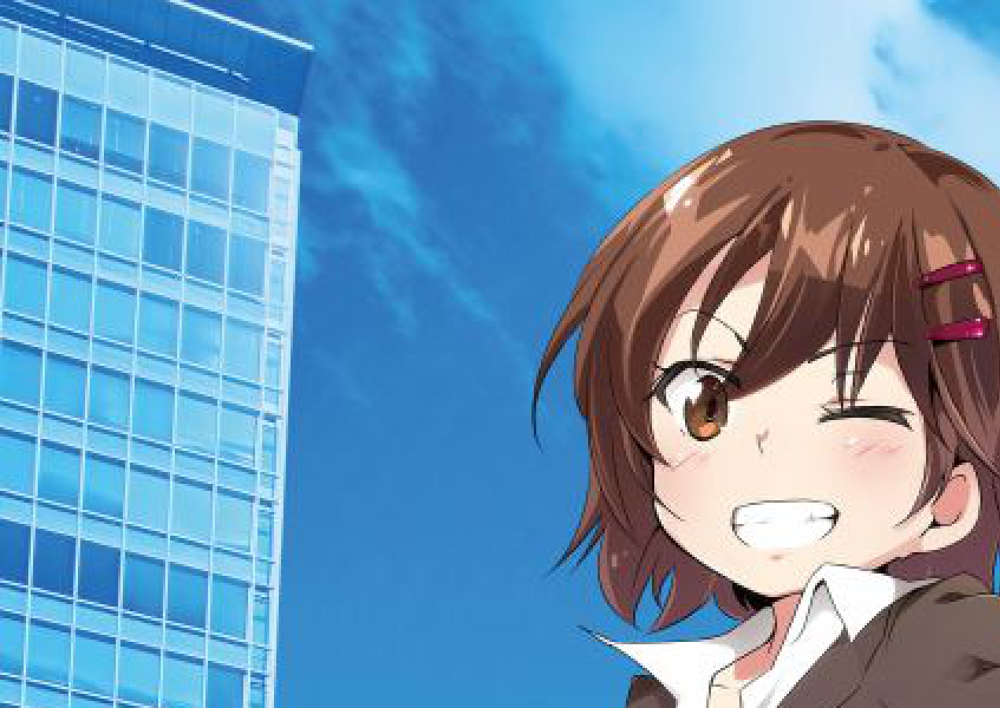

In [ ]:
image = Image.open("/content/B2.jpg")
zx = 3

replication = PIL.Image.new(image.mode, image.size)


for y in range(image.width):
  for x in range(image.height):
    coory = int(y/zx)
    coorx = int(x/zx)
    value0 = image.getpixel((coory,coorx))[0]
    value1 = image.getpixel((coory,coorx))[1]
    value2 = image.getpixel((coory,coorx))[2]
    replication.putpixel((y,x),(value0,value1,value2))

display(replication)